$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bm}[1]{{\bf #1}}
\newcommand{\bb}[1]{\bm{\mathrm{#1}}}
$$

# Part 2: Generative Adversarial Networks
<a id=part3></a>

In this part we will implement and train a generative adversarial network and apply it to the task of image generation.

In [1]:
import unittest
import os
import sys
import pathlib
import urllib
import shutil
import re
import zipfile

import numpy as np
import torch
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

test = unittest.TestCase()
plt.rcParams.update({'font.size': 12})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


### Obtaining the dataset
<a id=part3_1></a>

Let's begin by downloading a dataset of images that we want to learn to generate. 
We'll use the [Labeled Faces in the Wild](http://vis-www.cs.umass.edu/lfw/) (LFW) dataset which contains many labeled faces of famous individuals.

We're going to train our generative model to generate a specific face, not just any face.
Since the person with the most images in this dataset is former president George W. Bush, we'll set out to train a Bush Generator :)

However, if you feel adventurous and/or prefer to generate something else, feel free to edit the `PART2_CUSTOM_DATA_URL` variable in `hw3/answers.py`.


You can use a custom dataset, by editing the `PART3_CUSTOM_DATA_URL` variable in `hw3/answers.py`, and get a bonus!

In [2]:
import cs236781.plot as plot
import cs236781.download
from hw3.answers import PART3_CUSTOM_DATA_URL as CUSTOM_DATA_URL

DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')
if CUSTOM_DATA_URL is None:
    DATA_URL = 'http://vis-www.cs.umass.edu/lfw/lfw-bush.zip'
else:
    DATA_URL = CUSTOM_DATA_URL

_, dataset_dir = cs236781.download.download_data(out_path=DATA_DIR, url=DATA_URL, extract=True, force=False)

File C:\Users\yoyor\.pytorch-datasets\lfw-bush.zip exists, skipping download.
Extracting C:\Users\yoyor\.pytorch-datasets\lfw-bush.zip...
Extracted 531 to C:\Users\yoyor\.pytorch-datasets\lfw/George_W_Bush


Create a `Dataset` object that will load the extraced images:

In [3]:
import torchvision.transforms as T
from torchvision.datasets import ImageFolder

im_size = 64
tf = T.Compose([
    # Resize to constant spatial dimensions
    T.Resize((im_size, im_size)),
    # PIL.Image -> torch.Tensor
    T.ToTensor(),
    # Dynamic range [0,1] -> [-1, 1]
    T.Normalize(mean=(.5,.5,.5), std=(.5,.5,.5)),
])

ds_gwb = ImageFolder(os.path.dirname(dataset_dir), tf)

OK, let's see what we got. You can run the following block multiple times to display a random subset of images from the dataset.

Found 530 images in dataset folder.


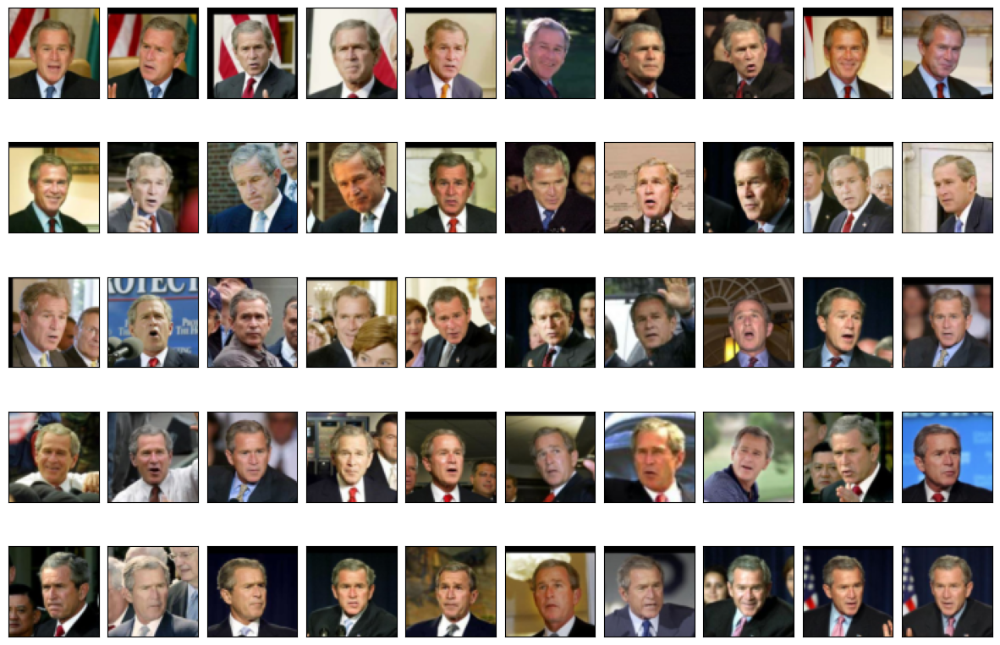

In [4]:
_ = plot.dataset_first_n(ds_gwb, 50, figsize=(15,10), nrows=5)
print(f'Found {len(ds_gwb)} images in dataset folder.')

In [5]:
x0, y0 = ds_gwb[0]
x0 = x0.unsqueeze(0).to(device)
print(x0.shape)

test.assertSequenceEqual(x0.shape, (1, 3, im_size, im_size))

torch.Size([1, 3, 64, 64])


## Generative Adversarial Nets (GANs)
<a id=part3_2></a>

GANs, first proposed in a [paper](https://arxiv.org/pdf/1406.2661.pdf) by Ian Goodfellow in 2014 are today arguably the most popular type of generative model. GANs are currently producing state of the art
results in generative tasks over many different domains.

In a GAN model, two different neural networks compete against each other: A **generator** and a **discriminator**.

- The Generator, which we'll denote as $\Psi _{\bb{\gamma}} : \mathcal{U} \rightarrow \mathcal{X}$, maps a latent-space variable
$\bb{u}\sim\mathcal{N}(\bb{0},\bb{I})$ to an instance-space variable $\bb{x}$ (e.g. an image).
Thus a parametric evidence distribution $p_{\bb{\gamma}}(\bb{X})$ is generated,
which we typically would like to be as close as possible to the real evidence distribution, $p(\bb{X})$.

- The Discriminator, $\Delta _{\bb{\delta}} : \mathcal{X} \rightarrow [0,1]$, is a network which,
given an instance-space variable $\bb{x}$, returns the  probability that $\bb{x}$ is real, i.e. that $\bb{x}$
was sampled from $p(\bb{X})$ and not $p_{\bb{\gamma}}(\bb{X})$.


<img src="imgs/gan.jpg" />

### Training GANs
<a id=part3_3></a>

The generator is trained to generate "fake" instances which will maximally fool the
discriminator into returning that they're real. Mathematically, the generator's parameters
$\bb{\gamma}$ should be chosen such as to **maximize** the expression
$$
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

The discriminator is trained to classify between real images, coming from the training set,
and fake images generated by the generator.
Mathematically, the discriminator's parameters $\bb{\delta}$ should be chosen such as to
**maximize** the expression
$$
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

These two competing objectives can thus be expressed as the following min-max optimization:
$$
\min _{\bb{\gamma}} \max _{\bb{\delta}} \,
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

A key insight into GANs is that we can interpret the above maximum as the *loss* with respect to
$\bb{\gamma}$:

$$
L({\bb{\gamma}}) =
\max _{\bb{\delta}} \, \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
  \mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

This means that the generator's loss function trains together with the generator
itself in an adversarial manner. In contrast, when training our VAE we used a fixed L2 norm
as a data loss term.

### Model Implementation
<a id=part3_4></a>

We'll now implement a Deep Convolutional GAN (DCGAN) model.
See the DCGAN [paper](https://arxiv.org/pdf/1511.06434.pdf) for architecture ideas and tips for training.

**TODO**: Implement the `Discriminator` class in the `hw3/gan.py` module.
If you wish you can reuse the `EncoderCNN` class from the VAE model as the first part of the Discriminator.

In [15]:
import hw3.gan as gan

dsc = gan.Discriminator(in_size=x0[0].shape).to(device)
print(dsc)

d0 = dsc(x0)
print(d0.shape)

test.assertSequenceEqual(d0.shape, (1,1))

Discriminator(
  (cnn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (fc): Sequential(
    (0): Linear(in_features=8192, out_features=1, bias=True)
  )
)
torch.Size([1, 1])


**TODO**: Implement the `Generator` class in the `hw3/gan.py` module.
If you wish you can reuse the `DecoderCNN` class from the VAE model as the last part of the Generator.

In [7]:
z_dim = 128
gen = gan.Generator(z_dim, 4).to(device)
print(gen)

z = torch.randn(1, z_dim).to(device)
xr = gen(z)
print(xr.shape)

test.assertSequenceEqual(x0.shape, xr.shape)

Generator(
  (fc): Linear(in_features=128, out_features=8192, bias=True)
  (net): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): Tanh()
  )
)
torch.Size([1, 3, 64, 64])


### Loss Implementation
<a id=part3_5></a>

Let's begin with the discriminator's loss function.
Based on the above we can flip the sign and say we want to update the 
Discriminator's parameters $\bb{\delta}$ so that they **minimize** the expression
$$
- \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, - \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

We're using the Discriminator twice in this expression;
once to classify data from the real data distribution and
once again to classify generated data.
Therefore our loss should be computed based on these two terms.
Notice that since the discriminator returns a probability, we can formulate the above as two cross-entropy losses.

GANs are notoriously diffucult to train.
One common trick for improving GAN stability during training is to make the classification labels noisy for the discriminator. This can be seen as a form of regularization, to help prevent the discriminator from overfitting.

We'll incorporate this idea into our loss function. Instead of labels being equal to 0 or 1, we'll make them
"fuzzy", i.e. random numbers in the ranges $[0\pm\epsilon]$ and $[1\pm\epsilon]$.

**TODO**: Implement the `discriminator_loss_fn()` function in the `hw3/gan.py` module.

In [8]:
from hw3.gan import discriminator_loss_fn
torch.manual_seed(42)

y_data = torch.rand(10) * 10
y_generated = torch.rand(10) * 10

loss = discriminator_loss_fn(y_data, y_generated, data_label=1, label_noise=0.3)
print(loss)

test.assertAlmostEqual(loss.item(), 6.4808731, delta=1e-5)


tensor(6.4809)


Similarly, the generator's parameters $\bb{\gamma}$ should **minimize** the expression
$$
-\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) ))
$$

which can also be seen as a cross-entropy term. This corresponds to "fooling" the discriminator; Notice that the gradient of the loss w.r.t $\bb{\gamma}$ using this expression also depends on $\bb{\delta}$.

**TODO**: Implement the `generator_loss_fn()` function in the `hw3/gan.py` module.

In [9]:
from hw3.gan import generator_loss_fn
torch.manual_seed(42)

y_generated = torch.rand(20) * 10

loss = generator_loss_fn(y_generated, data_label=1)
print(loss)

test.assertAlmostEqual(loss.item(), 0.0222969, delta=1e-3)

tensor(0.0223)


### Sampling
<a id=part3_6></a>

Sampling from a GAN is straightforward, since it learns to generate data from an isotropic Gaussian latent space distribution.

There is an important nuance however. Sampling is required during the process of training the GAN, since
we generate fake images to show the discriminator.
As you'll seen in the next section,  in some cases we'll need our samples to have gradients (i.e., to be part of
the Generator's computation graph).

**TODO**: Implement the `sample()` method in the `Generator` class within the `hw3/gan.py` module.

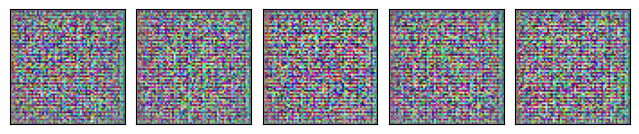

In [10]:
samples = gen.sample(5, with_grad=False)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNone(samples.grad_fn)
_ = plot.tensors_as_images(samples.cpu())

samples = gen.sample(5, with_grad=True)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNotNone(samples.grad_fn)

### Training
<a id=part3_7></a>

Training GANs is a bit different since we need to train two models simultaneously, each with it's own separate loss function and optimizer. We'll implement the training logic as a function that handles one batch of data
and updates both the discriminator and the generator based on it.

As mentioned above, GANs are considered hard to train. To get some ideas and tips you can see this [paper](https://arxiv.org/pdf/1606.03498.pdf), this list of ["GAN hacks"](https://github.com/soumith/ganhacks) or just do it the hard way :)

**TODO**:
1. Implement the `train_batch` function in the `hw3/gan.py` module.
2. Tweak the hyperparameters in the `part3_gan_hyperparams()` function within the `hw3/answers.py` module.

In [11]:
import torch.optim as optim
from torch.utils.data import DataLoader
from hw3.answers import part2_gan_hyperparams

torch.manual_seed(42)

# Hyperparams
hp = part2_gan_hyperparams()
batch_size = hp['batch_size']
z_dim = hp['z_dim']

# Data
dl_train = DataLoader(ds_gwb, batch_size, shuffle=True)
im_size = ds_gwb[0][0].shape

# Model
dsc = gan.Discriminator(im_size).to(device)
gen = gan.Generator(z_dim, featuremap_size=4).to(device)

# Optimizer
def create_optimizer(model_params, opt_params):
    opt_params = opt_params.copy()
    optimizer_type = opt_params['type']
    opt_params.pop('type')
    return optim.__dict__[optimizer_type](model_params, **opt_params)
dsc_optimizer = create_optimizer(dsc.parameters(), hp['discriminator_optimizer'])
gen_optimizer = create_optimizer(gen.parameters(), hp['generator_optimizer'])

# Loss
def dsc_loss_fn(y_data, y_generated):
    return gan.discriminator_loss_fn(y_data, y_generated, hp['data_label'], hp['label_noise'])

def gen_loss_fn(y_generated):
    return gan.generator_loss_fn(y_generated, hp['data_label'])

# Training
checkpoint_file = 'checkpoints/gan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

# Show hypers
print(hp)

{'batch_size': 64, 'z_dim': 128, 'learn_rate': 0.0002, 'betas': (0.5, 0.999), 'disdiscriminator_optimizer': {}, 'generator_optimizer': {'type': 'Adam', 'betas': (0.5, 0.999), 'lr': 0.0002}, 'data_label': 0, 'label_noise': 0.15, 'discriminator_optimizer': {'type': 'Adam', 'betas': (0.5, 0.999), 'lr': 0.0002}}


**TODO**:
1. Implement the `save_checkpoint` function in the `hw3.gan` module. You can decide on your own criterion regarding whether to save a checkpoint at the end of each epoch.
1. Run the following block to train. It will sample some images from your model every few epochs so you can see the progress.
2. When you're satisfied with your results, rename the checkpoints file by adding `_final`. When you run the `main.py` script to generate your submission, the final checkpoints file will be loaded instead of running training. Note that your final submission zip will not include the `checkpoints/` folder. This is OK.

--- EPOCH 1/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:05<00:00,  1.64it/s]
Discriminator loss: 0.30691446032789016
Generator loss:     3.9891293578677707


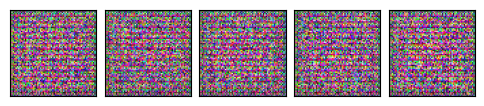

--- EPOCH 2/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.89it/s]
Discriminator loss: 0.05616858022080527
Generator loss:     6.151312722100152


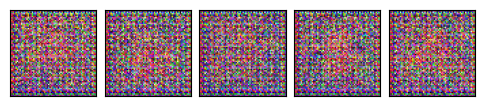

--- EPOCH 3/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.89it/s]
Discriminator loss: 0.1801393727461497
Generator loss:     10.749055173661974


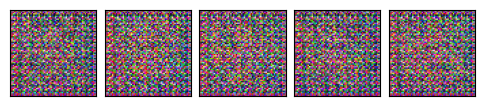

--- EPOCH 4/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.91it/s]
Discriminator loss: 0.5332586417595545
Generator loss:     13.574939727783203


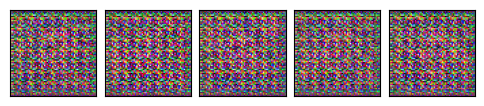

--- EPOCH 5/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.86it/s]
Discriminator loss: 0.24370207306411532
Generator loss:     13.930890083312988


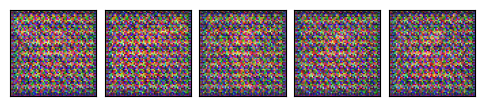

--- EPOCH 6/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.88it/s]
Discriminator loss: 0.12357596887482537
Generator loss:     9.079163074493408


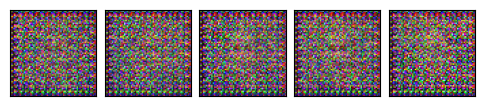

--- EPOCH 7/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.86it/s]
Discriminator loss: 0.06169479919804467
Generator loss:     7.88503885269165


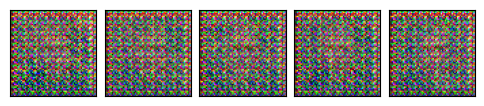

--- EPOCH 8/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.87it/s]
Discriminator loss: 0.05750620261662536
Generator loss:     7.385200553470188


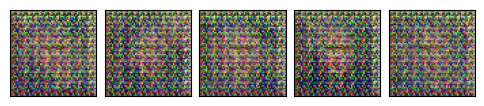

--- EPOCH 9/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.87it/s]
Discriminator loss: 0.06532858508742517
Generator loss:     8.435735066731771


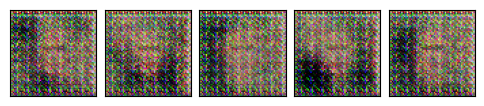

--- EPOCH 10/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.81it/s]
Discriminator loss: 0.11344965837068027
Generator loss:     8.008980804019505


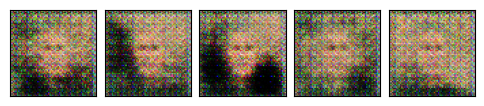

--- EPOCH 11/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.72it/s]
Discriminator loss: 1.78224605984158
Generator loss:     7.507438580195109


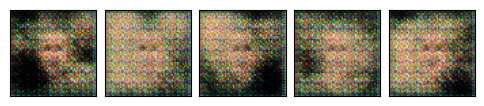

--- EPOCH 12/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.80it/s]
Discriminator loss: 0.29455170697636074
Generator loss:     4.345456467734443


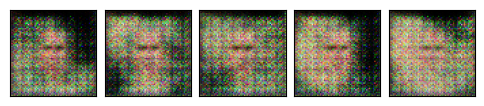

--- EPOCH 13/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.79it/s]
Discriminator loss: 0.46296072171794045
Generator loss:     4.918295542399089


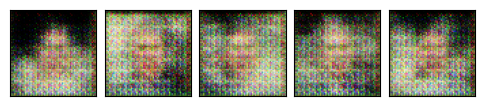

--- EPOCH 14/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.68it/s]
Discriminator loss: 0.5127004782358805
Generator loss:     4.835135857264201


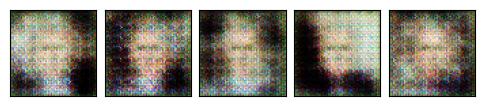

--- EPOCH 15/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.80it/s]
Discriminator loss: 0.47315023673905265
Generator loss:     4.729969210094875


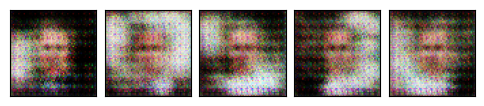

--- EPOCH 16/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.78it/s]
Discriminator loss: 0.6078234646055434
Generator loss:     4.507999261220296


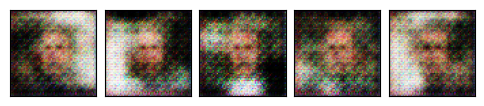

--- EPOCH 17/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.84it/s]
Discriminator loss: 0.6969073183006711
Generator loss:     4.500078201293945


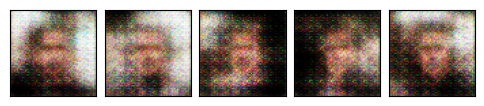

--- EPOCH 18/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.83it/s]
Discriminator loss: 0.6493204302257962
Generator loss:     4.265902333789402


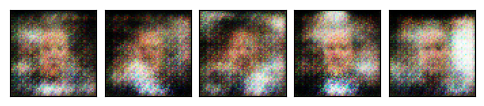

--- EPOCH 19/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.82it/s]
Discriminator loss: 0.6440393759144677
Generator loss:     5.81772690349155


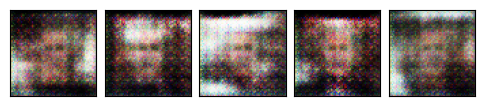

--- EPOCH 20/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.74it/s]
Discriminator loss: 0.5775356425179375
Generator loss:     5.356898519727919


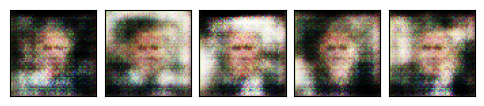

--- EPOCH 21/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.75it/s]
Discriminator loss: 0.7364913837777244
Generator loss:     5.151552597681682


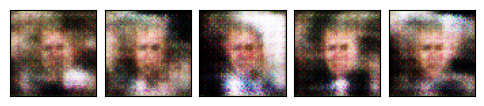

--- EPOCH 22/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.79it/s]
Discriminator loss: 0.5516502310832342
Generator loss:     4.395798179838392


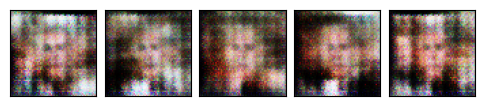

--- EPOCH 23/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.71it/s]
Discriminator loss: 0.34275588062074447
Generator loss:     4.801388184229533


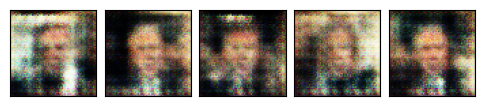

--- EPOCH 24/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.73it/s]
Discriminator loss: 0.9406393633948432
Generator loss:     5.283866080972883


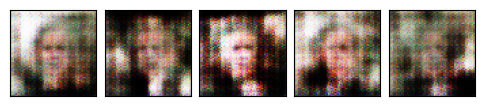

--- EPOCH 25/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.76it/s]
Discriminator loss: 0.5447681148846945
Generator loss:     4.29985605345832


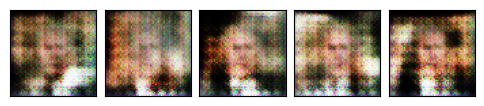

--- EPOCH 26/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.73it/s]
Discriminator loss: 0.38815995885266197
Generator loss:     4.739997757805718


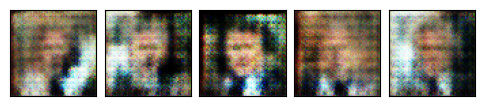

--- EPOCH 27/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.73it/s]
Discriminator loss: 0.6575826406478882
Generator loss:     5.689978996912639


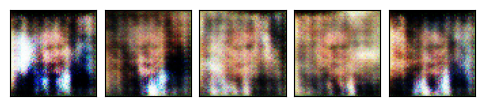

--- EPOCH 28/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.72it/s]
Discriminator loss: 0.6996766577164332
Generator loss:     4.540943596098158


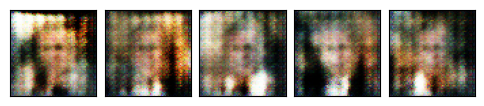

--- EPOCH 29/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.77it/s]
Discriminator loss: 0.5353714840279685
Generator loss:     4.52253164185418


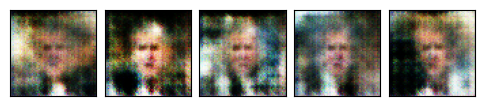

--- EPOCH 30/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.74it/s]
Discriminator loss: 0.5202045258548524
Generator loss:     4.388790766398112


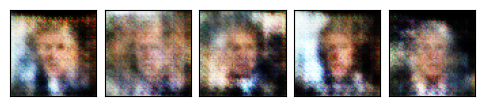

--- EPOCH 31/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.73it/s]
Discriminator loss: 0.6556075579590268
Generator loss:     4.195579555299547


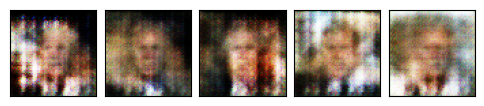

--- EPOCH 32/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.72it/s]
Discriminator loss: 0.4871519207954407
Generator loss:     4.0707218117184105


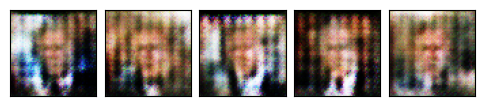

--- EPOCH 33/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.79it/s]
Discriminator loss: 0.42394885751936173
Generator loss:     4.15951410929362


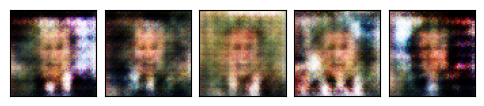

--- EPOCH 34/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.80it/s]
Discriminator loss: 0.5227343936761221
Generator loss:     3.801315281126234
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


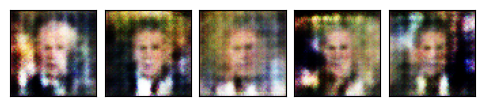

--- EPOCH 35/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.78it/s]
Discriminator loss: 0.5714394185278151
Generator loss:     3.823668122291565


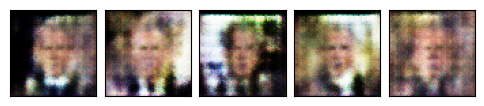

--- EPOCH 36/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.81it/s]
Discriminator loss: 0.5177191529009078
Generator loss:     3.733057220776876
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


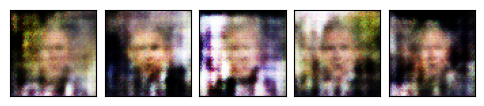

--- EPOCH 37/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.77it/s]
Discriminator loss: 0.6998143361674415
Generator loss:     4.072170601950751


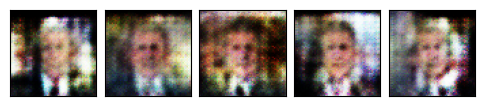

--- EPOCH 38/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.81it/s]
Discriminator loss: 0.9272473023997413
Generator loss:     4.522518012258741


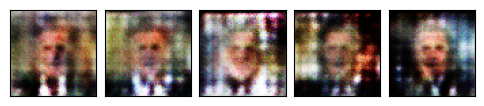

--- EPOCH 39/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.68it/s]
Discriminator loss: 0.5628198252783881
Generator loss:     3.8720252248975964


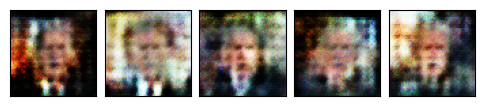

--- EPOCH 40/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.71it/s]
Discriminator loss: 0.5417892568641238
Generator loss:     3.6291243765089245
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


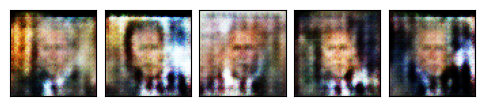

--- EPOCH 41/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.76it/s]
Discriminator loss: 0.32365772128105164
Generator loss:     3.9610950152079263


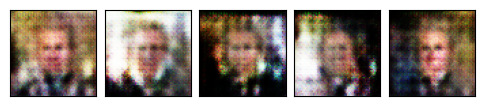

--- EPOCH 42/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.63it/s]
Discriminator loss: 0.7087051620086035
Generator loss:     4.485913991928101


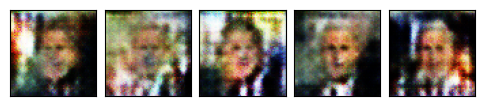

--- EPOCH 43/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.59it/s]
Discriminator loss: 0.5025215546290079
Generator loss:     3.4590335951911078
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


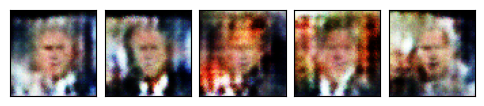

--- EPOCH 44/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.64it/s]
Discriminator loss: 0.5485911203755273
Generator loss:     4.163790411419338


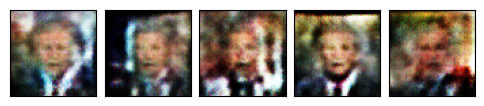

--- EPOCH 45/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.64it/s]
Discriminator loss: 0.4695044325457679
Generator loss:     3.4905767175886364


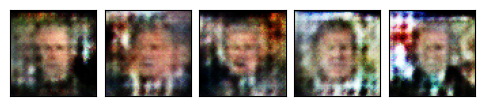

--- EPOCH 46/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.69it/s]
Discriminator loss: 0.3858817451530033
Generator loss:     3.989883449342516


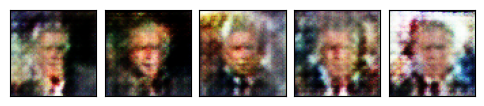

--- EPOCH 47/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.67it/s]
Discriminator loss: 0.4823201199372609
Generator loss:     3.907502099043793


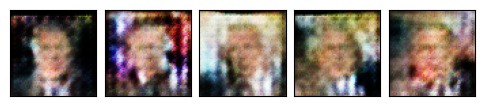

--- EPOCH 48/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.59it/s]
Discriminator loss: 0.9858911964628432
Generator loss:     4.513027363353306


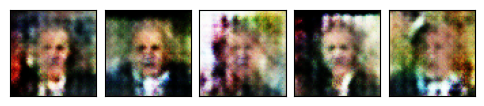

--- EPOCH 49/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.62it/s]
Discriminator loss: 0.4580092314216826
Generator loss:     3.9309982458750405


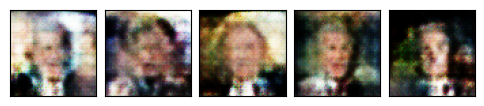

--- EPOCH 50/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.71it/s]
Discriminator loss: 0.785893546210395
Generator loss:     3.669289377000597


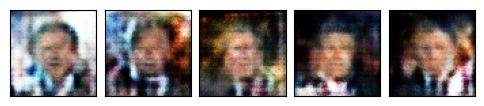

--- EPOCH 51/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.44it/s]
Discriminator loss: 0.41507845454745823
Generator loss:     3.34266914261712
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


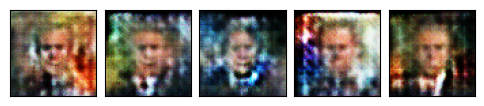

--- EPOCH 52/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.59it/s]
Discriminator loss: 0.4452158610026042
Generator loss:     3.774407598707411


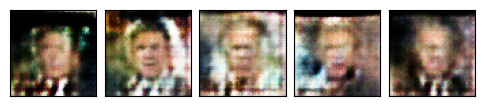

--- EPOCH 53/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.46it/s]
Discriminator loss: 0.7073964708381228
Generator loss:     3.8612141642305584


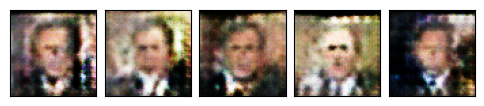

--- EPOCH 54/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.52it/s]
Discriminator loss: 0.7463902400599586
Generator loss:     4.287052737341987


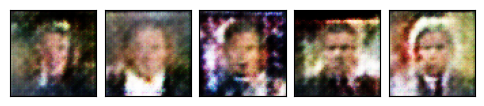

--- EPOCH 55/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.66it/s]
Discriminator loss: 0.4573426710234748
Generator loss:     3.9044694105784097


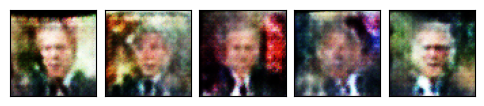

--- EPOCH 56/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.65it/s]
Discriminator loss: 0.45343802372614544
Generator loss:     3.285835795932346
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


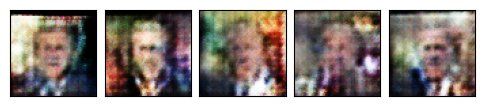

--- EPOCH 57/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.66it/s]
Discriminator loss: 0.5572427171799872
Generator loss:     4.549416727489895


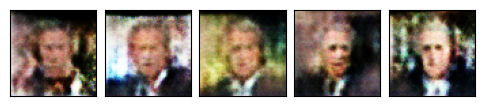

--- EPOCH 58/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.61it/s]
Discriminator loss: 0.4209030568599701
Generator loss:     3.6857552263471813


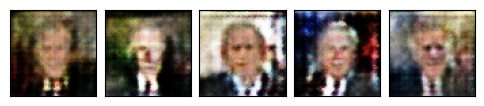

--- EPOCH 59/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.69it/s]
Discriminator loss: 0.46158013741175336
Generator loss:     4.19190514087677


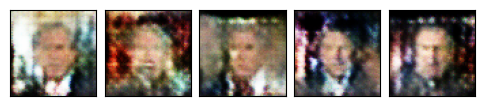

--- EPOCH 60/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.59it/s]
Discriminator loss: 0.4620676073763106
Generator loss:     4.133315430747138


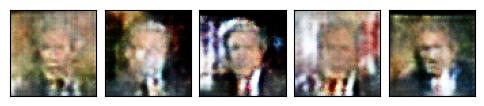

--- EPOCH 61/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.69it/s]
Discriminator loss: 0.5379079199499555
Generator loss:     3.6787041558159723


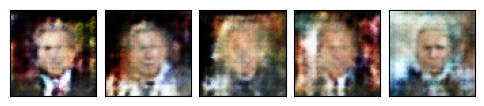

--- EPOCH 62/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.71it/s]
Discriminator loss: 0.4054691692193349
Generator loss:     4.16146018770006


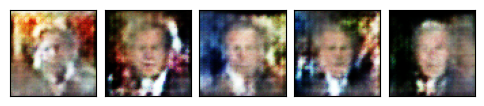

--- EPOCH 63/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.71it/s]
Discriminator loss: 0.4077543252044254
Generator loss:     3.8536670075522528


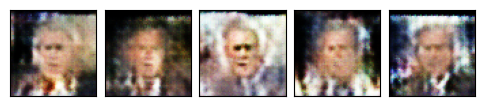

--- EPOCH 64/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.69it/s]
Discriminator loss: 0.624672735730807
Generator loss:     3.8174150122536554


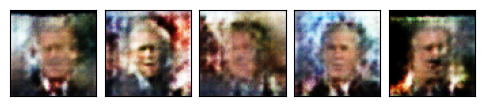

--- EPOCH 65/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.67it/s]
Discriminator loss: 0.37810180087884265
Generator loss:     3.743191056781345


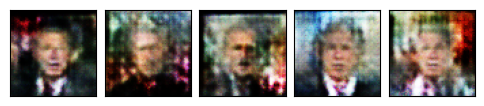

--- EPOCH 66/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.64it/s]
Discriminator loss: 0.24516009125444624
Generator loss:     3.455054521560669


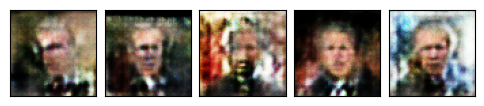

--- EPOCH 67/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.65it/s]
Discriminator loss: 0.29184596406088936
Generator loss:     3.789493534300062


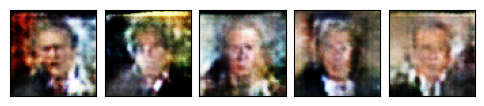

--- EPOCH 68/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.72it/s]
Discriminator loss: 0.482785701751709
Generator loss:     4.366456495390998


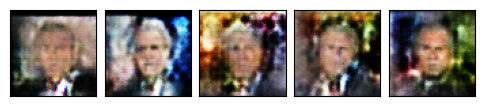

--- EPOCH 69/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.74it/s]
Discriminator loss: 1.1973017321692572
Generator loss:     3.6097851859198675


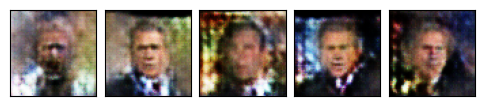

--- EPOCH 70/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.67it/s]
Discriminator loss: 0.46043068170547485
Generator loss:     3.5503084659576416


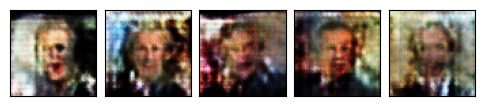

--- EPOCH 71/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.72it/s]
Discriminator loss: 0.32359667950206333
Generator loss:     3.372736030154758


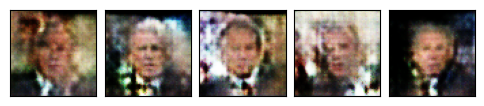

--- EPOCH 72/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.71it/s]
Discriminator loss: 0.32807399994797176
Generator loss:     3.8452971246507435


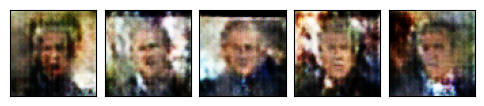

--- EPOCH 73/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.57it/s]
Discriminator loss: 0.23580927318996853
Generator loss:     3.815176169077555


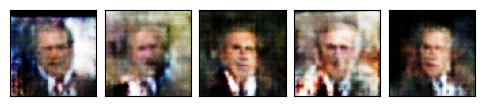

--- EPOCH 74/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.68it/s]
Discriminator loss: 0.7638808141152064
Generator loss:     4.251022020975749


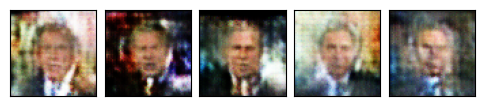

--- EPOCH 75/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.67it/s]
Discriminator loss: 0.35913338594966465
Generator loss:     3.7015603913201227


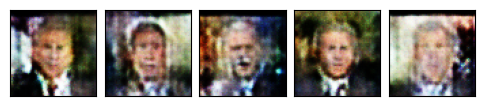

--- EPOCH 76/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.72it/s]
Discriminator loss: 0.25170142617490554
Generator loss:     3.6387494140201144


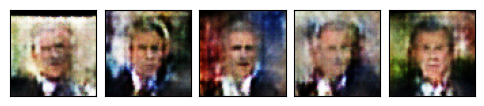

--- EPOCH 77/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.67it/s]
Discriminator loss: 0.4747002836730745
Generator loss:     3.9976584249072604


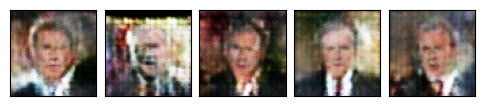

--- EPOCH 78/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.40it/s]
Discriminator loss: 0.35797279410892063
Generator loss:     4.039138052198622


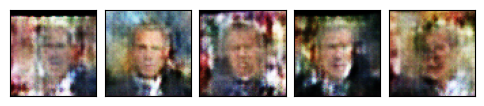

--- EPOCH 79/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.59it/s]
Discriminator loss: 0.4576973898543252
Generator loss:     4.089854293399387


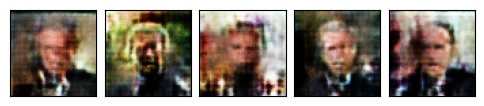

--- EPOCH 80/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.65it/s]
Discriminator loss: 0.32625054319699603
Generator loss:     4.109417888853285


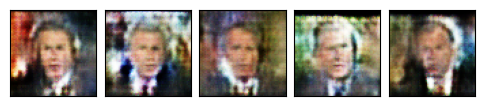

--- EPOCH 81/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.70it/s]
Discriminator loss: 0.2788855814271503
Generator loss:     3.4793900383843317


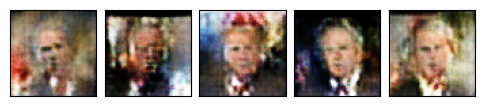

--- EPOCH 82/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.74it/s]
Discriminator loss: 0.182135542233785
Generator loss:     3.932715098063151


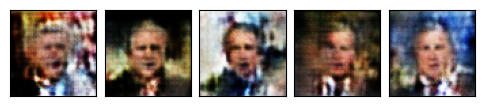

--- EPOCH 83/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.76it/s]
Discriminator loss: 0.9045277767711215
Generator loss:     3.9927622609668307


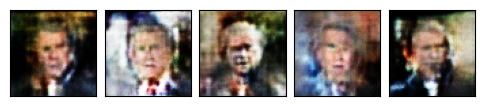

--- EPOCH 84/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.76it/s]
Discriminator loss: 0.633980909983317
Generator loss:     4.192520591947767


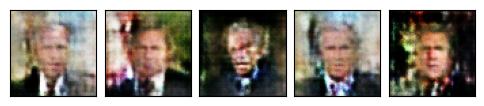

--- EPOCH 85/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.77it/s]
Discriminator loss: 0.4546441634496053
Generator loss:     3.39402445157369


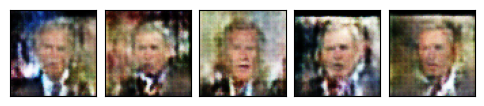

--- EPOCH 86/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.78it/s]
Discriminator loss: 0.3726041316986084
Generator loss:     4.0920183128780785


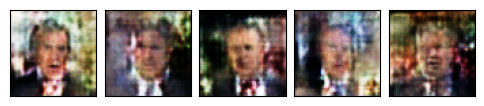

--- EPOCH 87/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.76it/s]
Discriminator loss: 0.3037600980864631
Generator loss:     3.668561670515272


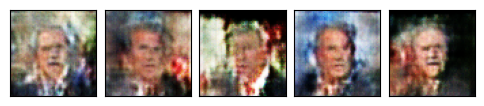

--- EPOCH 88/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.78it/s]
Discriminator loss: 0.28510594367980957
Generator loss:     3.7608664830525718


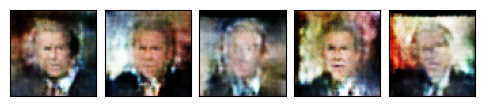

--- EPOCH 89/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.80it/s]
Discriminator loss: 0.17625117301940918
Generator loss:     3.5717831717597113


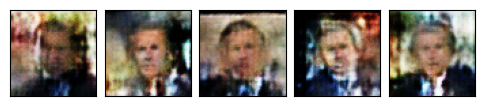

--- EPOCH 90/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.80it/s]
Discriminator loss: 0.21655170619487762
Generator loss:     3.971053229437934


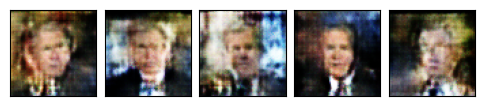

--- EPOCH 91/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.78it/s]
Discriminator loss: 0.22902842611074448
Generator loss:     3.944947852028741


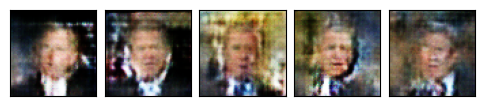

--- EPOCH 92/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.73it/s]
Discriminator loss: 0.20155138439602321
Generator loss:     4.190605004628499


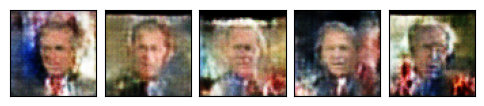

--- EPOCH 93/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.78it/s]
Discriminator loss: 0.23546606467829811
Generator loss:     3.422084801726871


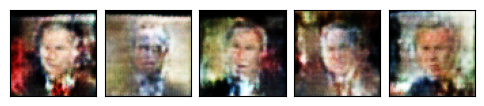

--- EPOCH 94/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.70it/s]
Discriminator loss: 1.2898732490009732
Generator loss:     4.534843020968967


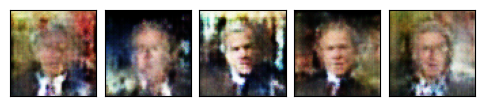

--- EPOCH 95/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.68it/s]
Discriminator loss: 0.40092843108707005
Generator loss:     3.3804916938145957


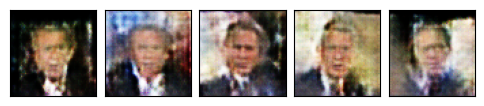

--- EPOCH 96/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.53it/s]
Discriminator loss: 0.35321447749932605
Generator loss:     4.022047387229072


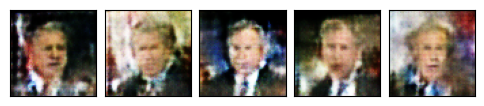

--- EPOCH 97/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.60it/s]
Discriminator loss: 0.2684720870521333
Generator loss:     3.8351000944773355


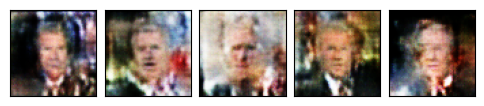

--- EPOCH 98/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.59it/s]
Discriminator loss: 0.3185584776931339
Generator loss:     3.82824805047777


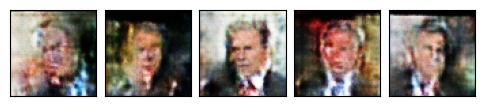

--- EPOCH 99/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.55it/s]
Discriminator loss: 0.1992492965526051
Generator loss:     3.8490453826056585


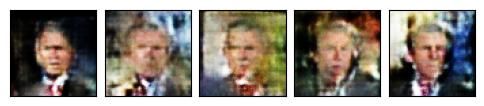

--- EPOCH 100/100 ---
100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.71it/s]
Discriminator loss: 0.18696296380625832
Generator loss:     3.3989911609225802


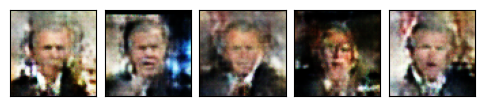

In [12]:
import IPython.display
import tqdm
from hw3.gan import train_batch, save_checkpoint

num_epochs = 100

if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

try:
    dsc_avg_losses, gen_avg_losses = [], []
    for epoch_idx in range(num_epochs):
        # We'll accumulate batch losses and show an average once per epoch.
        dsc_losses, gen_losses = [], []
        print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

        with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
            for batch_idx, (x_data, _) in enumerate(dl_train):
                x_data = x_data.to(device)
                dsc_loss, gen_loss = train_batch(
                    dsc, gen,
                    dsc_loss_fn, gen_loss_fn,
                    dsc_optimizer, gen_optimizer,
                    x_data)
                dsc_losses.append(dsc_loss)
                gen_losses.append(gen_loss)
                pbar.update()

        dsc_avg_losses.append(np.mean(dsc_losses))
        gen_avg_losses.append(np.mean(gen_losses))
        print(f'Discriminator loss: {dsc_avg_losses[-1]}')
        print(f'Generator loss:     {gen_avg_losses[-1]}')
        
        if save_checkpoint(gen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
            print(f'Saved checkpoint.')
            

        samples = gen.sample(5, with_grad=False)
        fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
        IPython.display.display(fig)
        plt.close(fig)
except KeyboardInterrupt as e:
    print('\n *** Training interrupted by user')

In [14]:
# Plot images from best or last model
if os.path.isfile(f'{checkpoint_file}.pt'):
    gen = torch.load(f'{checkpoint_file}.pt', map_location=device)
print('*** Images Generated from best model:')
samples = gen.sample(n=15, with_grad=False).cpu()
fig, _ = plot.tensors_as_images(samples, nrows=3, figsize=(6,6))

h
*** Images Generated from best model:


AttributeError: 'collections.OrderedDict' object has no attribute 'sample'

## Questions
<a id=part3_8></a>

**TODO** Answer the following questions. Write your answers in the appropriate variables in the module `hw3/answers.py`.

In [ ]:
from cs236781.answers import display_answer
import hw3.answers

### Question 1

Explain in detail why during training we sometimes need to maintain gradients when sampling from the GAN,
and other times we don't. When are they maintained and why? When are they discarded and why?

In [ ]:
display_answer(hw3.answers.part2_q1)

### Question 2

1. When training a GAN to generate images, should we decide to stop training solely based on the fact that  the Generator loss is below some threshold?
Why or why not?

2. What does it mean if the discriminator loss remains at a constant value while the generator loss decreases?

In [ ]:
display_answer(hw3.answers.part2_q2)

### Question 3

Compare the results you got when generating images with the VAE to the GAN results.
What's the main difference and what's causing it?

In [ ]:
display_answer(hw3.answers.part2_q3)